# Panfetal universal haematopoiesis
# 22 Apr 2022 Chenqu

In [1]:
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import rc
from matplotlib import colors
import seaborn as sb
from itertools import compress
import random

sc.settings.set_figure_params(dpi = 160, color_map = 'RdYlBu_r', dpi_save = 300, format = 'pdf')
plt.rcParams["figure.figsize"] = [6,6]

In [2]:
sb.set_palette('deep')

In [3]:
# import utils
import sys
sys.path.append('/home/jovyan/chenqu_utils')
from array_operations import *
sys.path.append('/home/jovyan/thymusatlas/')
import scjp
from scjp import model

In [4]:
organ_order = ['YS','LI','BM','TH','SP','MLN','SK','GU','KI']

In [5]:
# set working directory
%cd /home/jovyan/panfetal/

/home/jovyan/panfetal


In [6]:
# figure directory
fig_path = '/home/jovyan/mount/gdrive/Pan_fetal/plots_output/chenqu_jhub/'
sc.settings.figdir = fig_path

# Load HSC_IMMUNE data

In [7]:
immune = sc.read('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.20210429.HSC_IMMUNE.embedding.annotated.h5ad')

Only considering the two last: ['.annotated', '.h5ad'].
Only considering the two last: ['.annotated', '.h5ad'].


In [8]:
immune.var_names_make_unique()

In [9]:
immune.raw = immune.copy()

### exclude maternal contaminants

In [10]:
maternal_barcodes = pd.read_csv('souporcell/maternal_barcodes.csv')

In [11]:
maternal_barcodes['barcodes'] = [barcode.split('-')[0]+'-'+barcode.split('-')[1] for barcode in maternal_barcodes['x']]

In [12]:
print(sum(immune.obs_names.isin(maternal_barcodes['barcodes'])))
immune = immune[~immune.obs_names.isin(maternal_barcodes['barcodes'])]

0


### update annotations

In [13]:
obs = pd.read_csv('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv', index_col = 0) 
# final annotations and removed maternal contaminant cells, all the cells

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [14]:
for col in obs:
    immune.obs[col]=obs[col]

Trying to set attribute `.obs` of view, copying.


... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'anno_lvl_2_final_clean' as categorical


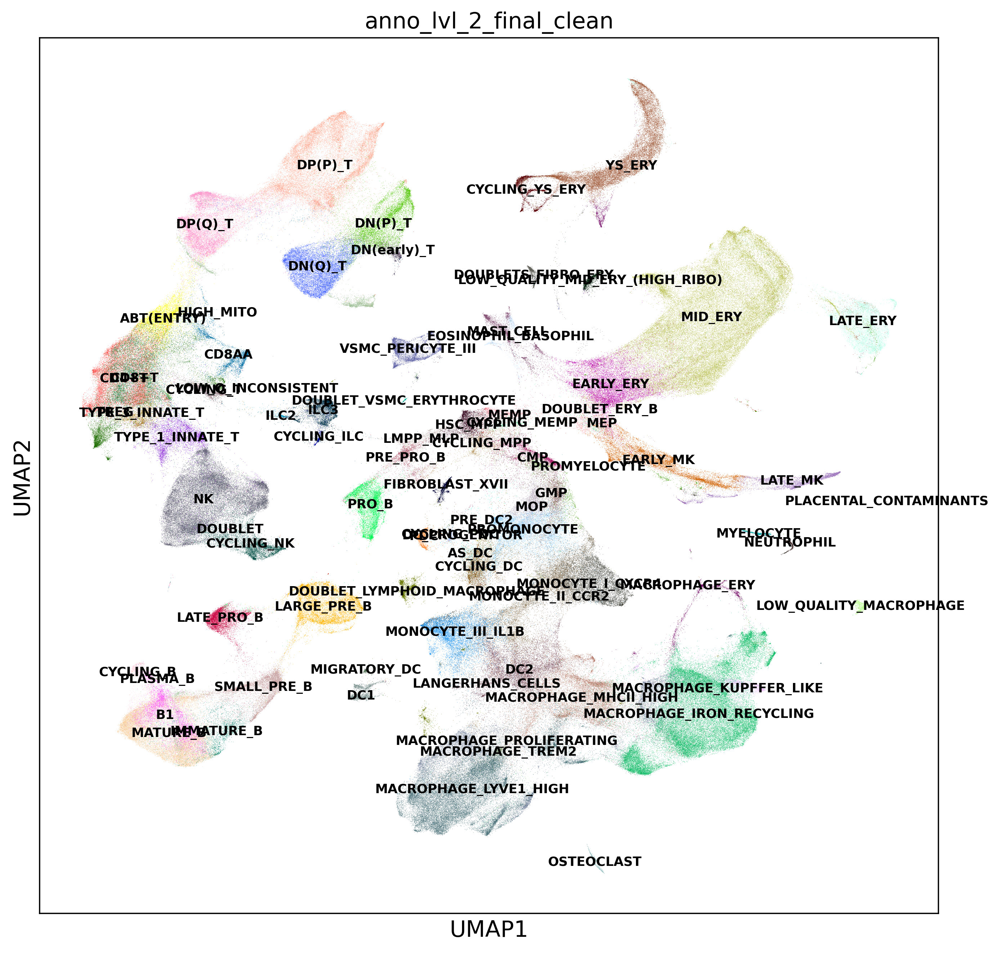

In [15]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.umap(immune,color=['anno_lvl_2_final_clean'],legend_loc='on data',legend_fontsize=8)

In [16]:
Counter(immune.obs['anno_lvl_2_final_clean'])

Counter({'CYCLING_DC': 3908,
         'EARLY_ERY': 11897,
         'PRE_DC2': 215,
         'MONOCYTE_II_CCR2': 10660,
         'LARGE_PRE_B': 10468,
         'DC1': 3138,
         'PROMONOCYTE': 9866,
         'LOW_Q_INCONSISTENT': 261,
         'MEMP': 2238,
         'DOUBLET_LYMPHOID_MACROPHAGE': 4747,
         'CYCLING_T': 2985,
         'EARLY_MK': 10152,
         'DC2': 11491,
         'MONOCYTE_III_IL1B': 8675,
         'MACROPHAGE_PROLIFERATING': 14391,
         'MAST_CELL': 3897,
         'PDC': 2473,
         'PRE_PRO_B': 3034,
         'PRO_B': 8113,
         'GMP': 3995,
         'EOSINOPHIL_BASOPHIL': 2334,
         'MACROPHAGE_MHCII_HIGH': 14872,
         'CD4+T': 13649,
         'CD8+T': 9369,
         'PROMYELOCYTE': 3113,
         'MACROPHAGE_LYVE1_HIGH': 35001,
         'CYCLING_B': 1909,
         'TREG': 6850,
         'LMPP_MLP': 1395,
         'NK': 30284,
         'FIBROBLAST_XVII': 2342,
         'CYCLING_NK': 7052,
         'ILC3': 5931,
         'ILC2': 468,
  

### Plot overall umap highlighting progenitors

In [17]:
T = ['DN(P)_T', 'DN(Q)_T', 'DP(P)_T', 'DP(Q)_T']
B = ['PRE_PRO_B','PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B']
Mem = ['MEMP','CYCLING_MEMP', 'MEP']
Mono = ['MOP','PROMONOCYTE']
DC = ['DC_PROGENITOR']
Granulocyte = ['PROMYELOCYTE', 'MYELOCYTE']
HSC = ['HSC_MPP','CMP','GMP','LMPP_MLP','ELP','DN(early)_T']
mye = Mono+Granulocyte+['CMP','GMP']+DC
progenitors = T+B+Mem+Mono+DC+Granulocyte+HSC

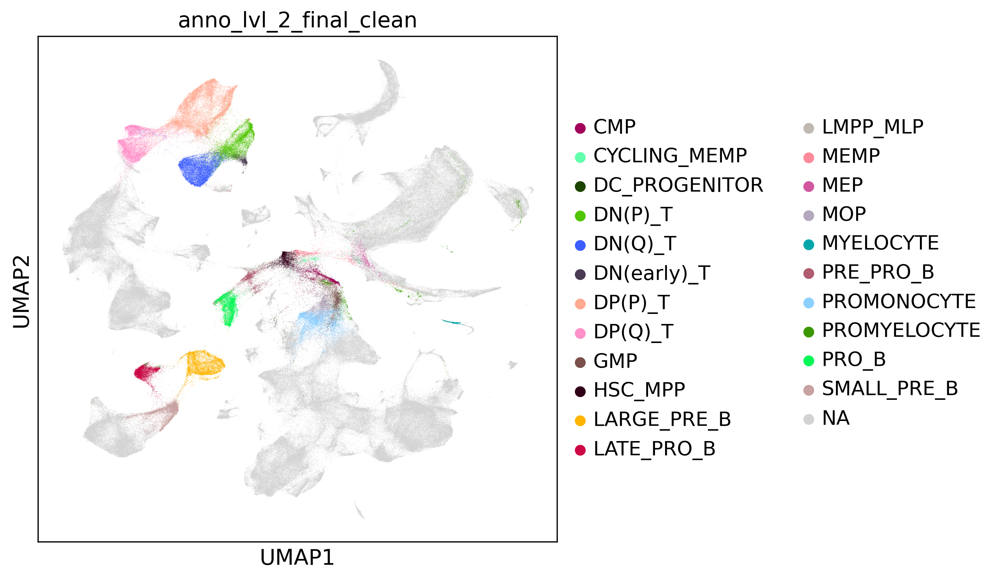

In [18]:
plt.rcParams["figure.figsize"] = [6,6]
sc.pl.umap(immune,color=['anno_lvl_2_final_clean'], groups=progenitors, legend_loc='right margin',save = 'HSC_progenitors.pdf')

# Density plot

### calculate overall density by organ, then split by each progenitor to show

In [20]:
sc.tl.embedding_density(immune, basis='umap', groupby='organ')

In [21]:
immune.obs['organ']=immune.obs['organ'].astype('category')
immune.obs['organ']=immune.obs['organ'].cat.reorder_categories(organ_order)

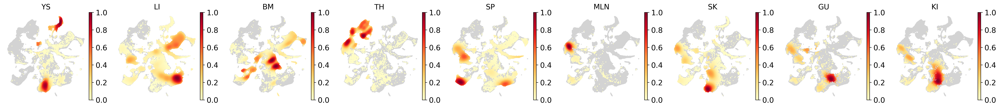

In [22]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.embedding_density(immune,basis='umap', ncols=10,key='umap_density_organ',fg_dotsize =10,bg_dotsize=10,frameon=False,wspace=0.2,save='hsc_immune_density.pdf')

### Plot B_progenitors

In [21]:
B_density = immune[immune.obs['anno_lvl_2_final_clean'].isin(B)]

(array([3.0870e+03, 6.1050e+03, 1.6042e+04, 3.4030e+03, 7.1430e+03,
        4.0200e+02, 1.0000e+01, 5.0000e+00, 1.2000e+01, 9.0000e+00]),
 array([-8.43737   , -5.6941257 , -2.9508812 , -0.20763664,  2.5356078 ,
         5.2788525 ,  8.022097  , 10.765342  , 13.508586  , 16.251831  ,
        18.995075  ], dtype=float32),
 <BarContainer object of 10 artists>)

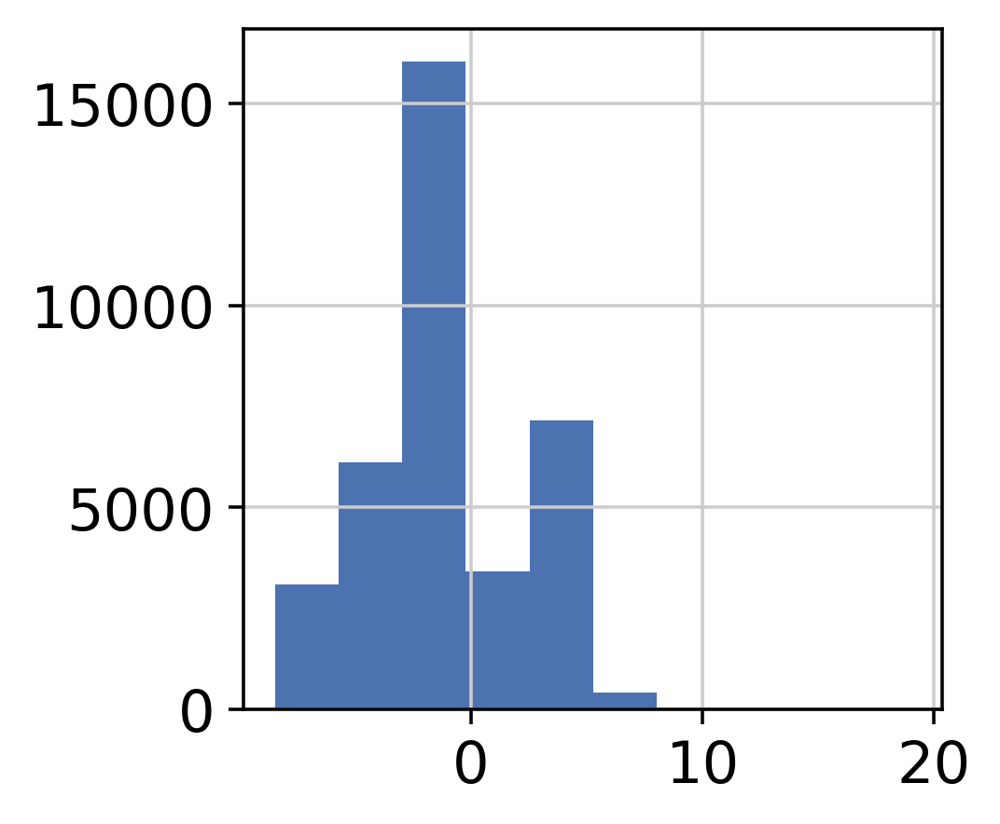

In [23]:
plt.hist(B_density.obsm['X_umap'][:,1])

In [24]:
a = B_density.obsm['X_umap'][:,0] < 5
b = B_density.obsm['X_umap'][:,1] < 8
selectlist = [a and b for a,b in zip(a,b)]
B_plot = B_density[selectlist].copy()

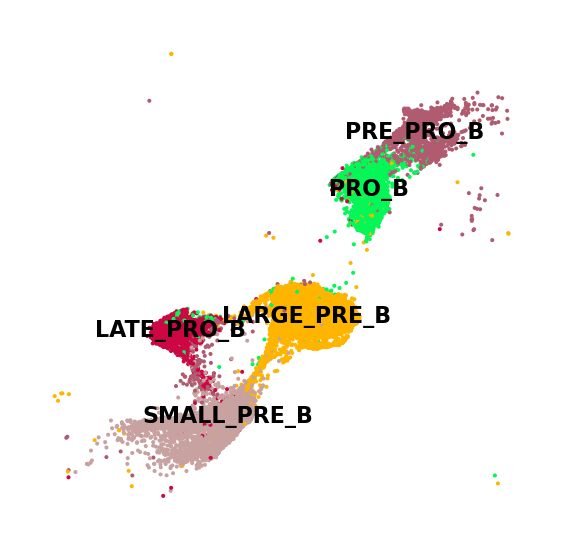

In [30]:
plt.rcParams["figure.figsize"] = [2,2]
sc.pl.umap(B_plot, color=['anno_lvl_2_final_clean'],legend_loc='on data',frameon=False, title='',legend_fontsize=5, save='B_prog.pdf')

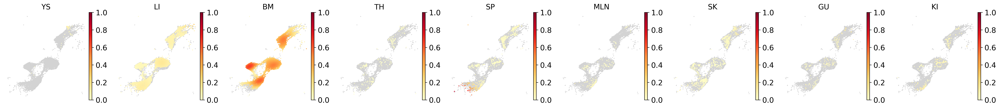

In [26]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.embedding_density(B_plot,basis='umap', ncols=9,key='umap_density_organ',fg_dotsize =10,bg_dotsize=10,frameon=False,wspace=0.2,save='B_prog_density.pdf')

### Plot T_progenitors

In [27]:
T_density = immune[immune.obs['anno_lvl_2_final_clean'].isin(T)]

(array([1.3000e+01, 6.0000e+00, 3.1000e+01, 2.1000e+01, 1.7000e+01,
        1.7290e+03, 1.5549e+04, 1.8258e+04, 1.4056e+04, 9.0140e+03]),
 array([ 0.54958653,  2.5439765 ,  4.5383663 ,  6.5327563 ,  8.527146  ,
        10.521537  , 12.515926  , 14.510317  , 16.504707  , 18.499096  ,
        20.493486  ], dtype=float32),
 <BarContainer object of 10 artists>)

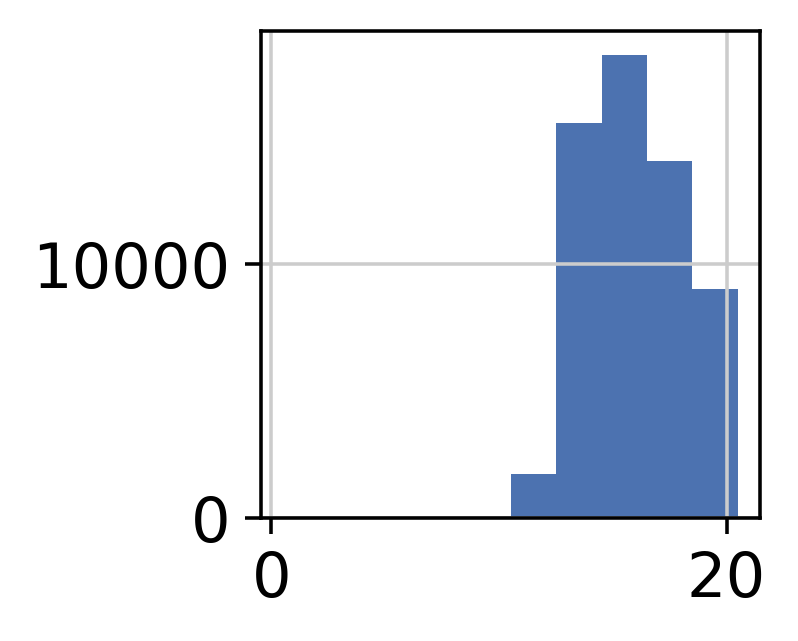

In [31]:
plt.hist(T_density.obsm['X_umap'][:,1])

In [32]:
a = T_density.obsm['X_umap'][:,0] < 5
b = T_density.obsm['X_umap'][:,1] > 10
selectlist = [a and b for a,b in zip(a,b)]
T_plot = T_density[selectlist].copy()

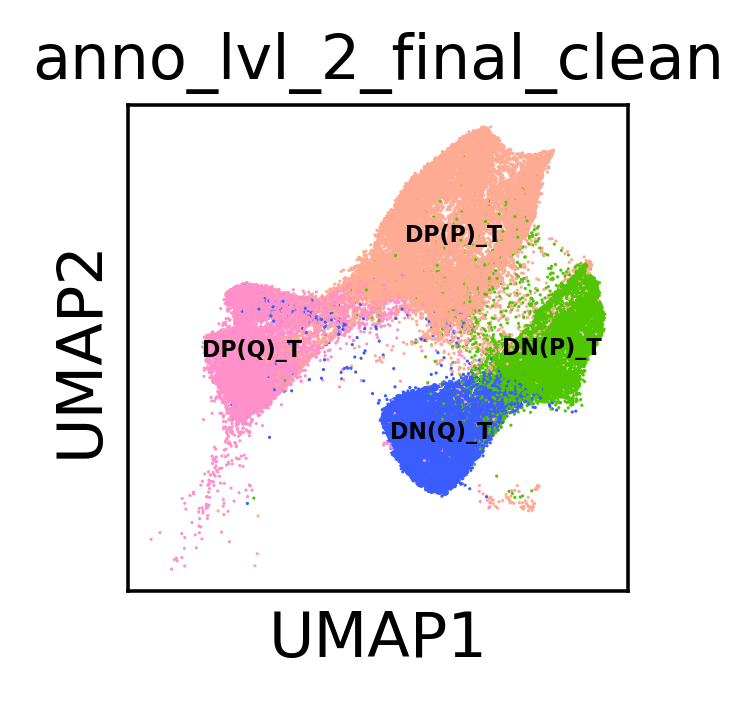

In [33]:
plt.rcParams["figure.figsize"] = [2,2]
sc.pl.umap(T_plot, color=['anno_lvl_2_final_clean'],legend_loc='on data',legend_fontsize=5, save='T_prog.pdf')

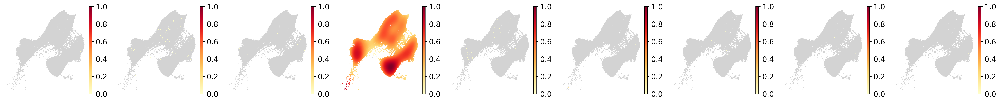

In [34]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.embedding_density(T_plot,basis='umap', ncols=9,key='umap_density_organ',fg_dotsize =10,bg_dotsize=10,frameon=False,wspace=0.2,title='',save='T_prog_density.pdf')

### Plot MEM_progenitors

In [23]:
mem_density = immune[immune.obs['anno_lvl_2_final_clean'].isin(Mem)]

(array([1.000e+00, 2.400e+01, 5.800e+01, 1.445e+03, 5.820e+02, 8.350e+02,
        1.385e+03, 1.770e+02, 5.600e+01, 5.000e+00]),
 array([ 0.5074557,  1.9936463,  3.4798367,  4.9660273,  6.4522176,
         7.9384084,  9.424599 , 10.9107895, 12.39698  , 13.88317  ,
        15.369361 ], dtype=float32),
 <BarContainer object of 10 artists>)

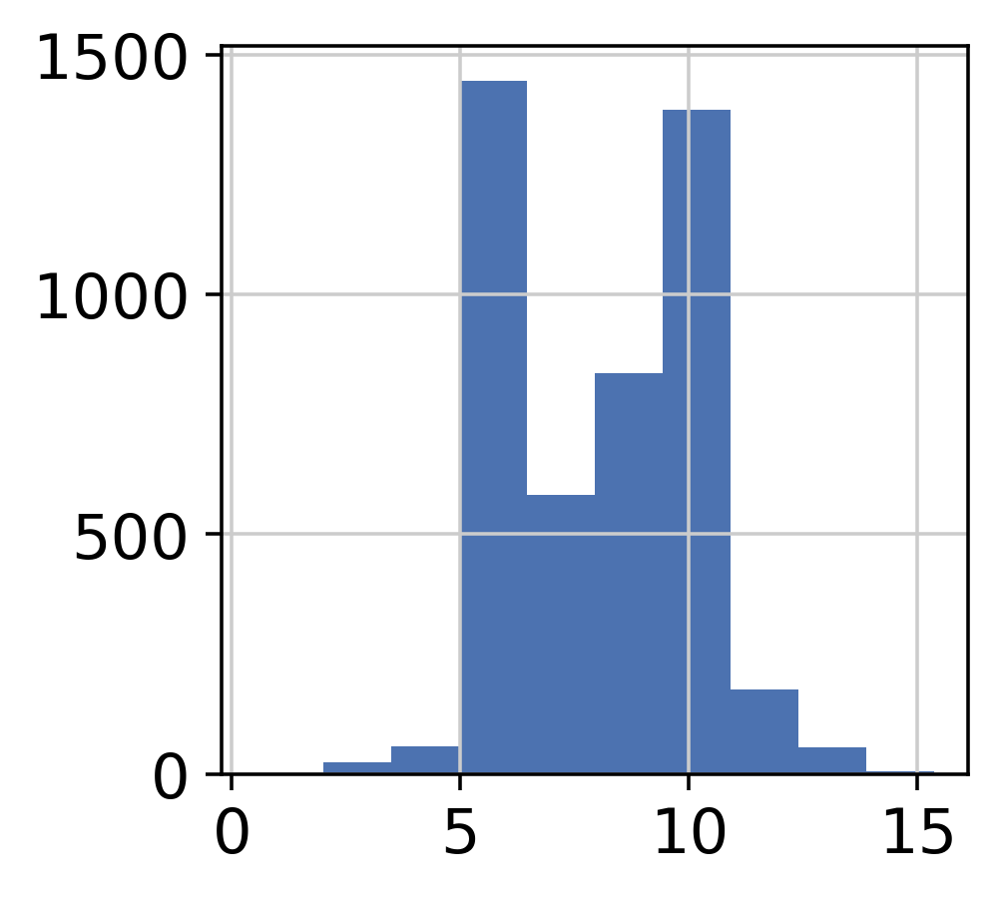

In [26]:
plt.hist(mem_density.obsm['X_umap'][:,0])

In [27]:
a = mem_density.obsm['X_umap'][:,0] < 15
b = mem_density.obsm['X_umap'][:,1] < 10
c = mem_density.obsm['X_umap'][:,0] >5
d = mem_density.obsm['X_umap'][:,1] >3
selectlist = [a and b for a,b in zip(a,b)]
selectlist = [a and b for a,b in zip(c,selectlist)]
selectlist = [a and b for a,b in zip(d,selectlist)]
mem_plot = mem_density[selectlist].copy()

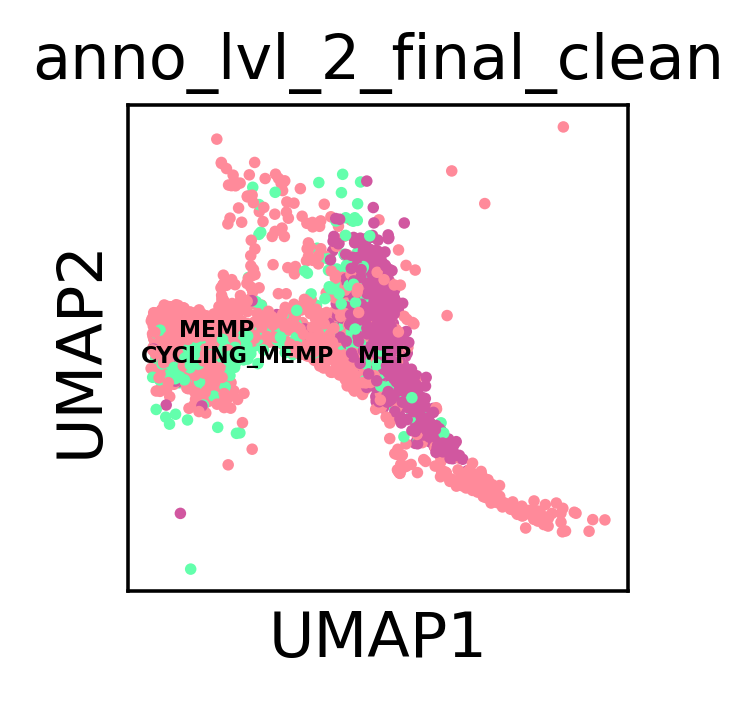

In [28]:
plt.rcParams["figure.figsize"] = [2,2]
sc.pl.umap(mem_plot, color=['anno_lvl_2_final_clean'],legend_loc='on data',legend_fontsize=5, save='mem_prog.pdf')

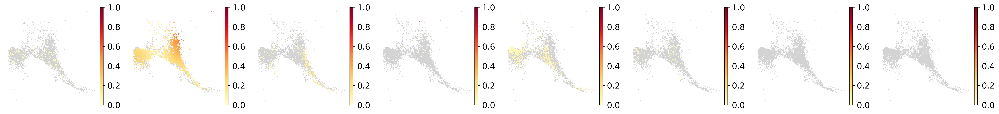

In [29]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.embedding_density(mem_plot,basis='umap', ncols=9,key='umap_density_organ',fg_dotsize =10,bg_dotsize=10,frameon=False,wspace=0.2,title='',save='mem_prog_density_2.pdf')

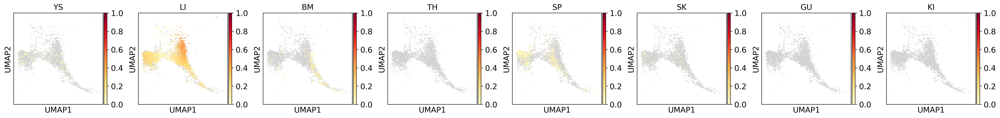

In [30]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.embedding_density(mem_plot,basis='umap', ncols=9,key='umap_density_organ',fg_dotsize =10,bg_dotsize=10)

### Plot mye_progenitors

In [41]:
mye_density = immune[immune.obs['anno_lvl_2_final_clean'].isin(mye)]

(array([4.000e+00, 1.700e+01, 5.800e+01, 7.710e+02, 1.731e+04, 5.338e+03,
        4.510e+02, 4.650e+02, 1.010e+02, 1.000e+01]),
 array([-13.334354  ,  -9.948773  ,  -6.5631924 ,  -3.1776114 ,
          0.20796967,   3.5935507 ,   6.9791317 ,  10.364713  ,
         13.750294  ,  17.135876  ,  20.521456  ], dtype=float32),
 <BarContainer object of 10 artists>)

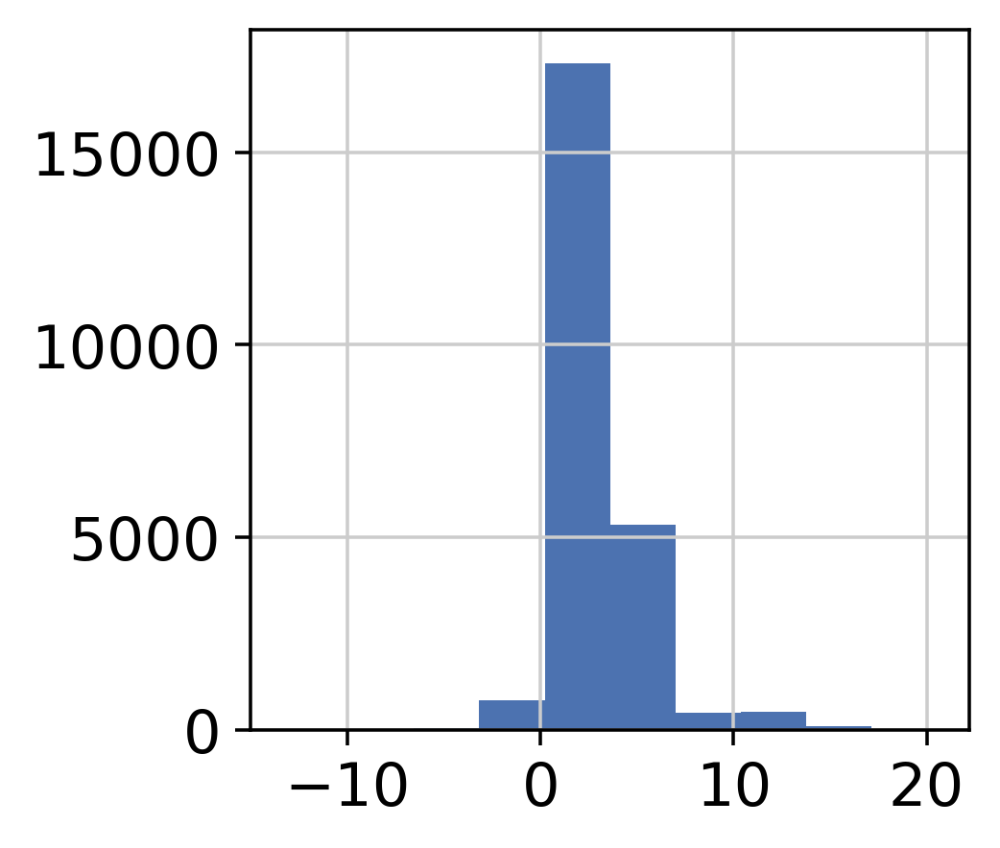

In [43]:
plt.hist(mye_density.obsm['X_umap'][:,1])

In [44]:
a = mye_density.obsm['X_umap'][:,0] >2
b = mye_density.obsm['X_umap'][:,1] >-2
c = mye_density.obsm['X_umap'][:,1] <7
selectlist = [a and b for a,b in zip(a,b)]
selectlist = [a and b for a,b in zip(c,selectlist)]
mye_plot = mye_density[selectlist].copy()

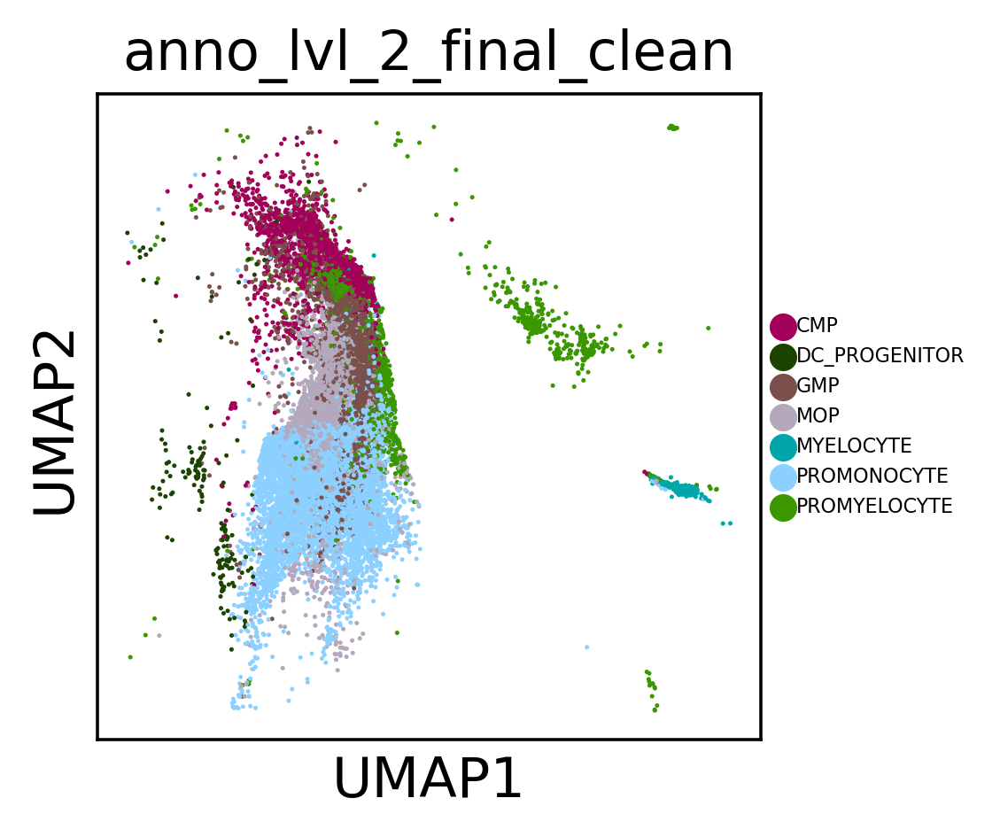

In [45]:
sc.pl.umap(mye_plot,color=['anno_lvl_2_final_clean'],legend_loc='right margin',legend_fontsize=5)

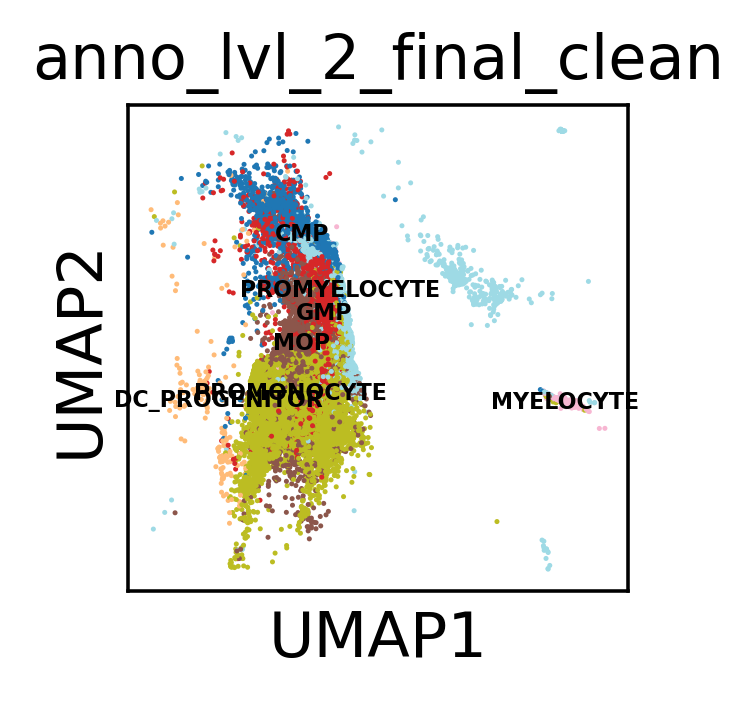

In [46]:
plt.rcParams["figure.figsize"] = [2,2]
sc.pl.umap(mye_plot, color=['anno_lvl_2_final_clean'],legend_loc='on data',legend_fontsize=5, palette='tab20', save='mye_prog.pdf')

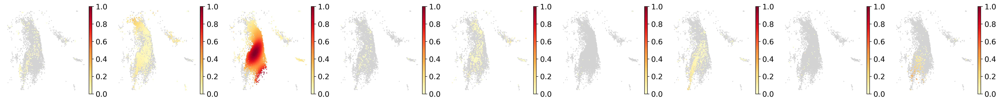

In [47]:
plt.rcParams["figure.figsize"] = [3,3]
sc.pl.embedding_density(mye_plot,basis='umap', ncols=9,key='umap_density_organ',fg_dotsize =10,bg_dotsize=10,frameon=False,wspace=0.2,title='',save='mye_prog_density.pdf')

# Cell number box plots

In [29]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [30]:
%%R
library(tidyverse)
library(ggplot2)

In [33]:
org_colors = pd.read_csv('metadata/organ_colors.csv')

In [34]:
data_dir = '/nfs/team205/ed6/data/Fetal_immune/'
timestamp = '20210429'
figdir = '/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/revision/'
anno_df = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.{t}.full_obs.annotated.clean.csv".format(t=timestamp), index_col=0)

In [35]:
## Filter maternal contaminants
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes["x"] = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])
anno_df = anno_df[~anno_df.index.isin(mat_barcodes["x"])]

In [37]:
## Assignment to progenitos
import json
progenitor_groups = {
    'T_prog':["DN(early)_T","DN(Q)_T", "DN(P)_T"],
    'B_prog' :['PRE_PRO_B','PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B'],
    'MEM_prog' : ['MEMP', 'CYCLING_MEMP', 'MEP'],
    'MYE_prog' : ['CMP','DC_PROGENITOR','GMP','MOP','MYELOCYTE','PROMONOCYTE','PROMYELOCYTE']
    }

with open('metadata/progenitor_groups.json', 'w') as outfile:
    json.dump({k:list(v) for k,v in progenitor_groups.items()}, outfile)

In [38]:
progenitor_groups_rev = {x:g for g,a in progenitor_groups.items() for x in a}

### Plot progenitor distribution

In [39]:
prog_df = anno_df[anno_df['anno_lvl_2_final_clean'].isin(progenitor_groups_rev.keys())]
prog_df = prog_df[['organ', 'donor', 'anno_lvl_2_final_clean']]
prog_df['lineage'] = [progenitor_groups_rev[x] for x in prog_df.anno_lvl_2_final_clean]


In [40]:
%%R -i prog_df -i org_colors -i figdir -w 1200 -h 600
org_palette <- setNames(org_colors$color, org_colors$organ)

lineage_names <- list(
  'MEM_prog'="Megakaryocyte/\nErythroid lineage",
  'MYE_prog'="Myeloid\nlineage",
  'B_prog'="B cells\nlineage",
  'T_prog'="T cells\nlineage"
)

lineage_labeller <- function(variable,value){
  return(lineage_names[value])
}

prog_df <- prog_df %>%
    rename(celltype=anno_lvl_2_final_clean) %>%
     group_by(organ, donor, lineage) %>%
    summarise(n_cells=n()) %>%
    pivot_wider(id_cols=c(donor, organ), names_from=lineage, values_from=n_cells, values_fill=0) %>%
    pivot_longer(cols=unique(prog_df$lineage), values_to='n_cells', names_to="lineage") %>%
    mutate(organ=factor(organ, levels=c("YS", "LI", "BM","TH", "SP", "MLN","SK", "KI", "GU"))) %>%
    mutate(lineage=factor(lineage, levels=c("MEM_prog", "MYE_prog", "B_prog", "T_prog"))) %>%
    group_by(organ, lineage) %>%
    mutate(median_n_cells=median(n_cells)) %>%
    ungroup() 
#     %>%
#     group_by(lineage) %>%
#     mutate(order = dense_rank(median_n_cells))
    

`summarise()` has grouped output by 'organ', 'donor'. You can override using the `.groups` argument.


In [41]:
%%R
ranking_df <- prog_df %>%
    group_by(organ, lineage) %>%
    summarise(median_n_cells = first(median_n_cells)) %>%
    ungroup() %>%
    group_by(lineage) %>%
    mutate(order = row_number(median_n_cells)) %>%
    ungroup() 

`summarise()` has grouped output by 'organ'. You can override using the `.groups` argument.


Joining, by = c("organ", "lineage", "median_n_cells")


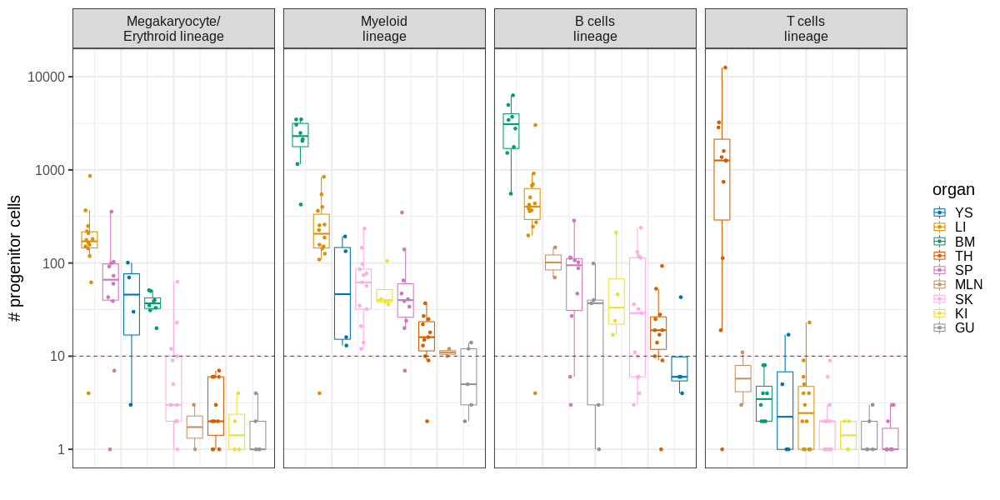

In [42]:
%%R -w 1200 -h 600
prog_df %>%
    left_join(ranking_df) %>%
    ggplot(aes(- order, n_cells+1, color=organ)) + 
    geom_boxplot(outlier.alpha=0, varwidth=FALSE) + 
#     geom_point() +
    geom_jitter(height=0, width=0.2) +
    scale_y_log10() +
    scale_color_manual(values=org_palette) +
    facet_grid(.~lineage, scales='free', labeller=lineage_labeller) +
    theme_bw(base_size=20) +
    ylab("# progenitor cells") + xlab("") +
    geom_hline(linetype=2, color='red', yintercept=10) +
    theme(axis.ticks.x=element_blank(), axis.text.x=element_blank()) +
    ggsave(paste0(figdir, "progenitor_cells_boxplot.pdf"), width=13, height=5)